# Lending Club Case-study

## Importing relevant libraries

In [1]:
# Import libraries
import sys
print("Current Python Interpreter: ", sys.executable)   # print current interpreter in use
import numpy as np
import pandas as pd
import seaborn as sns
import datetime
import matplotlib.pyplot as plt
#from re import search
import re

# Work with in-code markdown
from IPython.display import display, Markdown, Latex 

# work with plotly
import plotly.offline as py 
import plotly.io as pio
from plotly.subplots import make_subplots
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter
import plotly.express as px


Current Python Interpreter:  C:\WORK\Tools\Anaconda3\python.exe


## 0. Characterizing the dataset

### 0.1 Reading the loan dataset into pandas dataframe

In [2]:
# -- Read original database --
df_loan = pd.read_csv("loan.csv",low_memory=False)
print("Dataset shape: {}".format(df_loan.shape))
df_loan.head()

Dataset shape: (39717, 111)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


### 0.2 Missing values analysis

#### 0.2.1 Column-wise analysis

In [3]:
# -- Column-wise missing values analysis
col_miss = df_loan.isnull().sum()
col_miss_per = [round((100.0*i)/df_loan.shape[0],0) for i in col_miss]
#print(col_miss[10])
tr0 = go.Bar(
            x = df_loan.columns,
            y = col_miss_per,
            name='Column missing values'
        )
plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='Percentage missing values'
        ),
    xaxis=dict(
        title='Column Names',
        tickangle=60,
        dtick=1
    ),
    title='Column-wise Missing Values'
)
fig = go.Figure(data=plot_data, layout=layout)
py.iplot(fig, filename='col_missing')
pio.write_image(fig, "images/col_analysis.png", format='png')

#### 0.2.2 Row-wise analysis

In [4]:
# -- Row-wise missing values analysis
num_rows = df_loan.shape[0]
num_cols = df_loan.shape[1]
missing_cols_each_row = [df_loan.iloc[row_cntr].isnull().sum() for row_cntr in range(num_rows)]
per_missing_cols_each_row = [round(100.0*x/num_cols,2) for x in missing_cols_each_row]
print("Minimum missing (# missing cols, percentage): {}, {}".format(min(missing_cols_each_row),min(per_missing_cols_each_row)))
print("Maximum missing(# missing cols, percentage): {}, {}".format(max(missing_cols_each_row),max(per_missing_cols_each_row)))

Minimum missing (# missing cols, percentage): 54, 48.65
Maximum missing(# missing cols, percentage): 62, 55.86


In [5]:
tr0 = go.Histogram(
            x = per_missing_cols_each_row,
            name='Row missing values'
        )
plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='#Rows'
    ),
    xaxis=dict(
        title='Percentage missing values'
    ),
    title='Row-wise Missing Values'
)
fig = go.Figure(data=plot_data, layout=layout)
py.iplot(fig, filename='row_missing')
pio.write_image(fig, "images/row_analysis.png", format='png')

## 1. Cleaning up the dataset

### 1.1 Removing columns with too many missing values

In [6]:
#-- Configuration values 
DF_DROP_NAN_THRESH_PER = 100.00
# -- Implement 
min_num_nans = int((((100.0-DF_DROP_NAN_THRESH_PER)/100.0) * df_loan.shape[0])+1)
df_nan_cols_dropped = df_loan.dropna(axis=1,thresh=min_num_nans)
print("Resulting Dataset shape: {}".format(df_nan_cols_dropped.shape))
df_nan_cols_dropped.head()

Resulting Dataset shape: (39717, 57)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,Jun-16,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


In [7]:
# -- Column-wise missing values analysis
col_miss = df_nan_cols_dropped.isnull().sum()
col_miss_per = [round((100.0*i)/df_nan_cols_dropped.shape[0],0) for i in col_miss]
#print(col_miss[10])
non_zero_miss_col_name = []
non_zero_miss_col_per = []
non_zero_miss_col_count = []
for col_cntr in range(len(df_nan_cols_dropped.columns)):
    if col_miss[col_cntr] > 0:
        non_zero_miss_col_name.append(df_nan_cols_dropped.columns[col_cntr])
        non_zero_miss_col_per.append(col_miss_per[col_cntr])
        non_zero_miss_col_count.append(col_miss[col_cntr])
tr0 = go.Bar(
            x = non_zero_miss_col_name, #df_nan_cols_dropped.columns,
            y = non_zero_miss_col_count, #non_zero_miss_col_per, #col_miss_per,
            name='Column missing values',
            text = non_zero_miss_col_count
        )
plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='# Missing values'
    ),
    xaxis=dict(
        title='Column Names',
        tickangle=60,
        dtick=1
    ),
    title='Column-wise Missing Values (non-zero only)'
)
fig = go.Figure(data=plot_data, layout=layout)
py.iplot(fig, filename='col_missing_1')
pio.write_image(fig, "images/col_analysis_nonzero.png", format='png')

### 1.2 Removing rows with too many missing values

#### 1.2.1 Row-wise missing value analysis after removing columns with a high number of missing values

In [8]:
# -- Row-wise missing values analysis
num_rows = df_nan_cols_dropped.shape[0]
num_cols = df_nan_cols_dropped.shape[1]
missing_cols_each_row = [df_nan_cols_dropped.iloc[row_cntr].isnull().sum() for row_cntr in range(num_rows)]
per_missing_cols_each_row = [round(100.0*x/num_cols,2) for x in missing_cols_each_row]
print("Minimum missing (# missing cols, percentage): {}, {}".format(min(missing_cols_each_row),min(per_missing_cols_each_row)))
print("Maximum missing (# missing cols, percentage): {}, {}".format(max(missing_cols_each_row),max(per_missing_cols_each_row)))

print("")
df_miss_rows_cols_dropped = df_nan_cols_dropped

Minimum missing (# missing cols, percentage): 0, 0.0
Maximum missing (# missing cols, percentage): 8, 14.04



In [9]:
tr0 = go.Histogram(
            x = missing_cols_each_row,
            name='Row missing values'
        )
plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='#Rows'
    ),
    xaxis=dict(
        title='#Columns with missing values'
    ),
    title='Row-wise Missing Values'
)
fig = go.Figure(data=plot_data, layout=layout)
py.iplot(fig, filename='row_missing_1')
pio.write_image(fig, "images/row_missing.png", format='png')

### 1.3 Problem-specific Data Cleaning

#### 1.3.1 Removing redundant columns

In [10]:
# -- Remove redundant columns
df_redun_cols_dropped = df_miss_rows_cols_dropped
redundant_cols = ["url", "desc"] # Do not provie any additional information. 
                                # The information regarding purpose etc. is already embedded in other columns
for col_name in redundant_cols:
    if col_name in df_redun_cols_dropped.columns:
        # print("Dropping column: ",col_name)
        df_redun_cols_dropped.drop(col_name,axis=1,inplace=True)
print("Resulting dataset shape: ", df_redun_cols_dropped.shape)
df_redun_cols_dropped.head()

Resulting dataset shape:  (39717, 55)


C:\WORK\Tools\Anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,Jun-16,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


#### 1.3.2 Removing useless columns

In [11]:
useless_cols = ["delinq_2yrs", "earliest_cr_line","inq_last_6mths",
                "open_acc", "pub_rec", "revol_bal", "revol_util",
                "total_acc", "out_prncp", "out_prncp_inv", "total_pymnt",
                "total_pymnt_inv", "total_rec_prncp", "total_rec_int", 
                "total_rec_late_fee", "recoveries", "collection_recovery_fee", 
                'mths_since_last_record', 'mths_since_last_delinq',
                "last_pymnt_d", "last_pymnt_amnt", "last_credit_pull_d", "application_type"
                ]
useless_cols = useless_cols + ['id', 'member_id', "emp_title", "title"] # Do not provide any information for analysis
# print(useless_cols)
# print(df_redun_cols_dropped.columns)
cols_dropped = 0
for col_name in useless_cols:
    if col_name in df_redun_cols_dropped.columns:
        # print("Dropping column: ",col_name)
        df_redun_cols_dropped.drop(col_name,axis=1,inplace=True)
        cols_dropped = cols_dropped + 1
df_useless_cols_dropped =  df_redun_cols_dropped
print("# Columns dropped: ", cols_dropped)
print("Resulting dataset shape: ", df_useless_cols_dropped.shape)
df_useless_cols_dropped.head()

C:\WORK\Tools\Anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Columns dropped:  27
Resulting dataset shape:  (39717, 28)


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,dti,initial_list_status,next_pymnt_d,collections_12_mths_ex_med,policy_code,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,...,27.65,f,NaN,0.0,1,0,0.0,0,0.0,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,...,1.00,f,NaN,0.0,1,0,0.0,0,0.0,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,...,8.72,f,NaN,0.0,1,0,0.0,0,0.0,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,...,20.00,f,NaN,0.0,1,0,0.0,0,0.0,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,...,17.94,f,Jun-16,0.0,1,0,0.0,0,0.0,0.0


#### 1.3.3 Removing useless rows

In [12]:
#-- removing useless rows (loan status that are not charged off)
df_useless_rows_cols_dropped = df_useless_cols_dropped[df_useless_cols_dropped['loan_status']!="Current"]
print("Resulting dataset shape: ", df_useless_rows_cols_dropped.shape)
df_useless_rows_cols_dropped.head()

Resulting dataset shape:  (38577, 28)


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,dti,initial_list_status,next_pymnt_d,collections_12_mths_ex_med,policy_code,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,...,27.65,f,NaN,0.0,1,0,0.0,0,0.0,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,...,1.00,f,NaN,0.0,1,0,0.0,0,0.0,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,...,8.72,f,NaN,0.0,1,0,0.0,0,0.0,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,...,20.00,f,NaN,0.0,1,0,0.0,0,0.0,0.0
5,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,RENT,...,11.20,f,NaN,0.0,1,0,0.0,0,0.0,0.0


#### 1.3.4 Removing constant-valued columns

In [13]:
# -- Removing constant valued columns
#print(df_useless_rows_cols_dropped.columns)
df_useless_rows_cols_dropped.to_excel("data_useless_rows_cols_dropped.xlsx",index=False)
df_current_const_dropped = df_useless_rows_cols_dropped
temp_col_names = df_useless_rows_cols_dropped.columns
num_cols_dropped = 0
for col_name in temp_col_names:
    if len(df_useless_rows_cols_dropped[col_name].dropna().unique()) < 2:
        num_cols_dropped = num_cols_dropped + 1
        df_current_const_dropped.drop(col_name,axis=1,inplace=True)
df_current_const_dropped.to_excel("df_current_const_dropped.xlsx",index=False)
print("#Columns dropped: ", num_cols_dropped)
print("Resulting data shape: ",df_current_const_dropped.shape)
df_current_const_dropped.head()

C:\WORK\Tools\Anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#Columns dropped:  9
Resulting data shape:  (38577, 19)


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,zip_code,addr_state,dti,pub_rec_bankruptcies
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,860xx,AZ,27.65,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,309xx,GA,1.00,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,606xx,IL,8.72,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,917xx,CA,20.00,0.0
5,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,852xx,AZ,11.20,0.0


#### 1.3.5 Fixing dirty column data

In [14]:
# -- Fixing dirty columns
# print(df_current_const_dropped.columns)
df_fixed_dirty_column = df_current_const_dropped.copy()
## Rounding off monetary amount numerical values
df_fixed_dirty_column['loan_amnt'] = df_fixed_dirty_column['loan_amnt'].round()
df_fixed_dirty_column['funded_amnt'] = df_fixed_dirty_column['funded_amnt'].round()
df_fixed_dirty_column['funded_amnt_inv'] = df_fixed_dirty_column['funded_amnt_inv'].round()
df_fixed_dirty_column['annual_inc'] = df_fixed_dirty_column['annual_inc'].round()
df_fixed_dirty_column['installment'] = df_fixed_dirty_column['installment'].round(2)
## Converting issue date
df_fixed_dirty_column["issue_d"] = pd.to_datetime(df_fixed_dirty_column["issue_d"], format="%b-%y")
df_fixed_dirty_column["issue_month"] = [date_val.month for date_val in df_fixed_dirty_column["issue_d"]]
df_fixed_dirty_column["issue_year"] = [date_val.year for date_val in df_fixed_dirty_column["issue_d"]]
df_fixed_dirty_column.drop("issue_d",axis=1,inplace=True)   # Removing the now-redundant column
## Converting interest percentage
df_fixed_dirty_column["int_rate"] = [round(float(x.rstrip("%")),2) for x  in df_fixed_dirty_column["int_rate"]]
# Converting to categorical
# -- Loan payment status
dict_loan_status = {"Charged Off": 0, "Fully Paid":1}
df_fixed_dirty_column["loan_status_cat"] = [dict_loan_status[x] for x in df_fixed_dirty_column["loan_status"]]
# df_fixed_dirty_column["loan_status"].replace(("Charged Off","Fully Paid"),(0,1),inplace=True)   # payment status
# -- Employment Length
dict_emp_length = {'< 1 year': 0, '1 year': 1, '2 years': 2, '3 years':3, '4 years':4, '5 years':5, '6 years':6, '7 years':7, '8 years':8, '9 years':9, '10+ years':10, np.nan:11}
rev_dict_emp_length = {0:'< 1 year', 1:'1 year', 2:'2 years', 3:'3 years', 4:'4 years', 5:'5 years', 6:'6 years', 7:'7 years', 8:'8 years', 9:'9 years', 10:'10+ years', 11: "None"}
df_fixed_dirty_column["emp_length_cat"] = [dict_emp_length[x] for x in df_fixed_dirty_column["emp_length"]]
# -- verification status
df_fixed_dirty_column["verified"] = [0 if re.search("Not", x) else 1 for x in  df_fixed_dirty_column["verification_status"]]
# Write to excel
df_fixed_dirty_column.to_excel("df_fixed_dirty_column.xlsx",index=False)
# df_fixed_dirty_column.columns

#### 1.3.6 Imputing Data

In [15]:
# -- Imputing data
df_final_data = df_fixed_dirty_column
# To fill a specific coloumn which has NAN values with forward values
df_final_data['pub_rec_bankruptcies']= df_final_data['pub_rec_bankruptcies'].fillna(method="ffill")
df_final_data['emp_length']= df_final_data['emp_length'].fillna(method="ffill")
df_final_data.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,purpose,zip_code,addr_state,dti,pub_rec_bankruptcies,issue_month,issue_year,loan_status_cat,emp_length_cat,verified
0,5000,5000,4975.0,36 months,10.65,162.87,B,B2,10+ years,RENT,...,credit_card,860xx,AZ,27.65,0.0,12,2011,1,10,1
1,2500,2500,2500.0,60 months,15.27,59.83,C,C4,< 1 year,RENT,...,car,309xx,GA,1.00,0.0,12,2011,0,0,1
2,2400,2400,2400.0,36 months,15.96,84.33,C,C5,10+ years,RENT,...,small_business,606xx,IL,8.72,0.0,12,2011,1,10,0
3,10000,10000,10000.0,36 months,13.49,339.31,C,C1,10+ years,RENT,...,other,917xx,CA,20.00,0.0,12,2011,1,10,1
5,5000,5000,5000.0,36 months,7.90,156.46,A,A4,3 years,RENT,...,wedding,852xx,AZ,11.20,0.0,12,2011,1,3,1


#### 1.3.7 Adding Columns

In [16]:
# -- Adding columns for categorical analysis
# to create a new column by substracting two coloumns and grouping them.
df_final_data['loan_diff'] = df_final_data.apply(lambda x: x['loan_amnt'] - x['funded_amnt_inv'], axis=1)
df_final_data["funding_status"] = [ "equal" if x < 1 else "lesser" for x in  df_final_data['loan_diff']]
df_final_data.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,addr_state,dti,pub_rec_bankruptcies,issue_month,issue_year,loan_status_cat,emp_length_cat,verified,loan_diff,funding_status
0,5000,5000,4975.0,36 months,10.65,162.87,B,B2,10+ years,RENT,...,AZ,27.65,0.0,12,2011,1,10,1,25.0,lesser
1,2500,2500,2500.0,60 months,15.27,59.83,C,C4,< 1 year,RENT,...,GA,1.00,0.0,12,2011,0,0,1,0.0,equal
2,2400,2400,2400.0,36 months,15.96,84.33,C,C5,10+ years,RENT,...,IL,8.72,0.0,12,2011,1,10,0,0.0,equal
3,10000,10000,10000.0,36 months,13.49,339.31,C,C1,10+ years,RENT,...,CA,20.00,0.0,12,2011,1,10,1,0.0,equal
5,5000,5000,5000.0,36 months,7.90,156.46,A,A4,3 years,RENT,...,AZ,11.20,0.0,12,2011,1,3,1,0.0,equal


#### 1.3.8 Removing outliers

##### Original Data

count    38577.000000
mean     11047.025430
std       7348.441646
min        500.000000
25%       5300.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64
count    38577.000000
mean     10784.058506
std       7090.306027
min        500.000000
25%       5200.000000
50%       9550.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64
count    38577.000000
mean     10222.480571
std       7022.721532
min          0.000000
25%       5000.000000
50%       8733.000000
75%      14000.000000
max      35000.000000
Name: funded_amnt_inv, dtype: float64


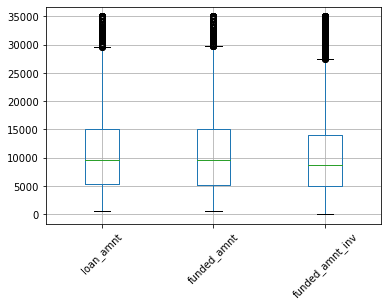

In [17]:
# To determine outliers in a columns useing box plots:
df_final_data.boxplot(column=['loan_amnt', 'funded_amnt', 'funded_amnt_inv'], rot=45)

print(df_final_data['loan_amnt'].describe())
print(df_final_data['funded_amnt'].describe())
print(df_final_data['funded_amnt_inv'].describe())

count    38577.000000
mean       322.466318
std        208.639215
min         15.690000
25%        165.740000
50%        277.860000
75%        425.550000
max       1305.190000
Name: installment, dtype: float64

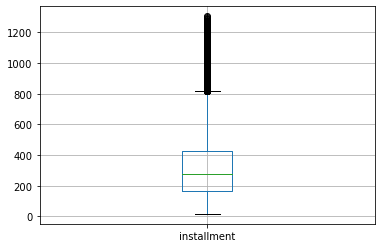

In [18]:
df_final_data.boxplot(column=['installment'])
df_final_data['installment'].describe()

count    3.857700e+04
mean     6.877797e+04
std      6.421868e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.886800e+04
75%      8.200000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

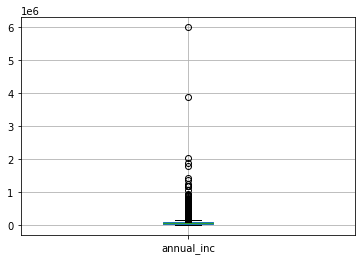

In [19]:
df_final_data.boxplot(column=['annual_inc'])
df_final_data['annual_inc'].describe()

count    38577.000000
mean        13.272727
std          6.673044
min          0.000000
25%          8.130000
50%         13.370000
75%         18.560000
max         29.990000
Name: dti, dtype: float64

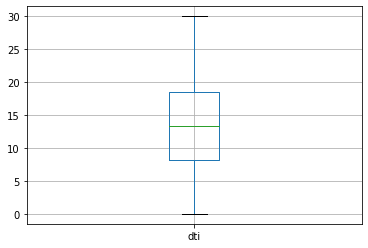

In [20]:
df_final_data.boxplot(column=['dti'])
df_final_data['dti'].describe()

##### Removing Outliers

In [21]:
# to delete outliers in coloumns which are above 99 percentile.
# -- Loan Amount
loan_amnt_out_thres = df_final_data["loan_amnt"].quantile(0.99)
df_final_data = df_final_data[df_final_data["loan_amnt"] < loan_amnt_out_thres]
# -- Funded Amount
funded_amnt_out_thres = df_final_data["funded_amnt"].quantile(0.99)
df_final_data = df_final_data[df_final_data["funded_amnt"] < funded_amnt_out_thres]
# -- Funded Amount Inv
funded_amnt_inv_out_thres = df_final_data["funded_amnt_inv"].quantile(0.99)
df_final_data = df_final_data[df_final_data["funded_amnt_inv"] < funded_amnt_inv_out_thres]
# -- Installment
installment_out_thres = df_final_data["installment"].quantile(0.99)
df_final_data = df_final_data[df_final_data["installment"] < installment_out_thres]
# -- Annual Income
annual_inc_out_thres = df_final_data["annual_inc"].quantile(0.99)
df_final_data = df_final_data[df_final_data["annual_inc"] < annual_inc_out_thres]

##### After Outlier Removal

<AxesSubplot:>

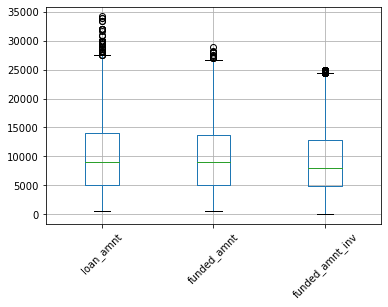

In [22]:
# To VISUALIZE outliers in a columns are REMOVED using box plots:
df_final_data.boxplot(column=['loan_amnt', 'funded_amnt', 'funded_amnt_inv'], rot=45)

<AxesSubplot:>

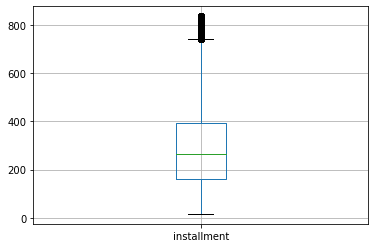

In [23]:
df_final_data.boxplot(column=['installment'])

<AxesSubplot:>

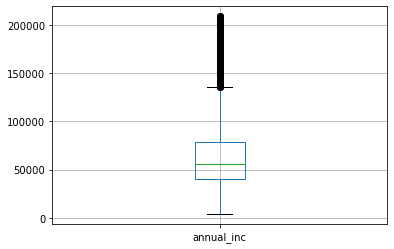

In [24]:
df_final_data.boxplot(column=['annual_inc'])

count    36350.000000
mean        13.309395
std          6.668557
min          0.000000
25%          8.170000
50%         13.400000
75%         18.600000
max         29.990000
Name: dti, dtype: float64

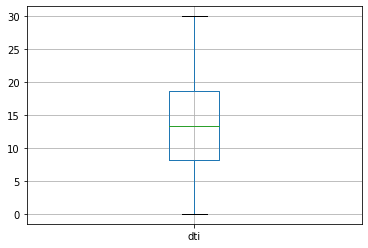

In [25]:
df_final_data.boxplot(column=['dti'])
df_final_data['dti'].describe()

#### 1.3.9 Creating Categorical variables from continuous ones

In [26]:
# -- Installment
installment_bins= [0, 100, 200, 300, 400, 500, 600, 700, 800, float('Inf')]
installment_labels= ['< 100', '100-200', '200-300', '300-400', '400-500', '500-600', '600-700', '700-800', '> 800']
df_final_data['installment_cat'] = pd.cut(df_final_data['installment'], bins=installment_bins, labels=installment_labels).astype('category')

# -- Annual Income
annual_inc_bins= [0, 20000, 40000, 60000, 80000, 100000, 120000, 140000, 160000, 180000, 200000, float('Inf')]
annual_inc_labels= ['< 20k', '20k-40k', '40k-60k', '60k-80k', '80k-100k', '100k-120k', '120k-140k', '140k-160k', '160k-180k', '180k-200k', '> 200k']
df_final_data['annual_inc_cat'] = pd.cut(df_final_data['annual_inc'], bins=annual_inc_bins, labels=annual_inc_labels).astype('category')

# -- Interest Rate
int_rate_bins= [0, 3, 6, 9, 12, 15, 18, 20, float('Inf')]
int_rate_labels= ['< 3%', "3%-6%", '6%-9%', '9%-12%', '12%-15%', '15%-18%', '18%-20%', '> 20%']
df_final_data['int_rate_cat'] = pd.cut(df_final_data['int_rate'], bins=int_rate_bins, labels=int_rate_labels).astype('category')

# -- Funded Amount Inv
funded_amnt_inv_bins= [0, 3000, 6000, 9000, 12000, 15000, 18000, 21000,  float('Inf')]
funded_amnt_inv_lables= ['< 3k', '3k-6k', '6k-9k', '9k-12k', '12k-15k', '15k-18k', '18k-21k', '> 21k']
df_final_data['funded_amnt_inv_cat'] = pd.cut(df_final_data['funded_amnt_inv'], bins=funded_amnt_inv_bins, labels=funded_amnt_inv_lables).astype('category')

# -- DTI
dti_inv_bins= [0, 5, 10, 15, 20, 25, float('Inf')]
dti_inv_lables= ['< 5', '5-10', '10-15', '15-20', '20-25', '>25']
df_final_data['dti_cat'] = pd.cut(df_final_data['dti'], bins=dti_inv_bins, labels=dti_inv_lables).astype('category')

Text(0.5, 0.98, '')

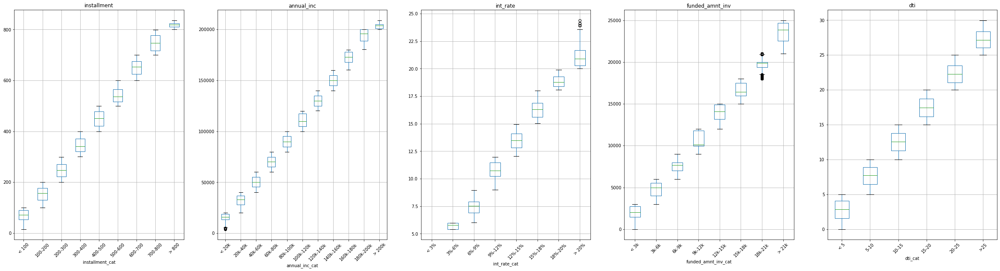

In [27]:
cat_conv_vars = ['installment' ,'annual_inc','int_rate','funded_amnt_inv','dti']
# f, axes = plt.subplots(1, len(cat_conv_vars))
# for var_name in cat_conv_vars:
#     df_final_data.boxplot(column=var_name, by='{}_cat'.format(var_name), figsize=(10, 8))
fig, axes = plt.subplots(1,5,sharex=False,sharey=False,figsize=(40, 10))
for var_cntr in range(len(cat_conv_vars)):
    var_name = cat_conv_vars[var_cntr]
    a = df_final_data.boxplot(column=var_name, by='{}_cat'.format(var_name), ax=axes[var_cntr],rot=45)
fig.suptitle('')

### Final Dataset 

In [28]:
#-- Write final cleaned data to excel
df_final_data.to_excel("data_final.xlsx",index=False)
df_final_data.to_csv("data_final.csv",index=False)
df_final_data = pd.read_csv("data_final.csv")



In [29]:
df_final_data.columns
dict_col_disp = {
    'loan_amnt': 'Loan Amount', 'funded_amnt':'Funded Amount', 'funded_amnt_inv':'Funded Amount Invested', 
    'term':'Loan Term', 'int_rate': 'Interest Rate',     'installment':'Installment Amount', 
    'grade':'Grade', 'sub_grade':'Sub-grade', 'emp_length':'Employment Length', 
    'home_ownership':'Home Ownership', 'annual_inc':'Annual Income', 
    'verification_status': 'Verification Status', 'loan_status': 'Loan Status', 
    'purpose':'Purpose', 'zip_code':'Zip Code', 'addr_state':'Address State', 
    'dti':'Debt-to-Income Ratio', 'pub_rec_bankruptcies':'Public Recorded Bankruptcies', 
    'issue_month':'Issue Month', 'issue_year':'Issue Year', 
    'loan_status_cat':'Loan Status', 
    'emp_length_cat': 'Employment Length', 'verified': 'Verification Status',
    'loan_diff':'Loan Difference', 'funding_status':'Funding Status', 
    'installment_cat': 'Installment Amount', 'annual_inc_cat': 'Annual Income',
    'int_rate_cat':'Interest Rate', 'funded_amnt_inv_cat':'Funded Amount Invested', 'dti_cat':'Debt-to-Income Ratio',
    'funding_status': "Funding Status"
}

In [30]:
## Set ordering of categoical variables
dict_order_cat_vars = {
    'installment_cat':      {'< 100':0,     '100-200':1,    '200-300':2,    '300-400':3,    '400-500':4,    '500-600':5,    '600-700':6,    '700-800':7,    '> 800':8},
    'annual_inc_cat':       {'< 20k':0,     '20k-40k':1,    '40k-60k':2,    '60k-80k':3,    '80k-100k':4,   '100k-120k':5,  '120k-140k':6,  '140k-160k':7,  '160k-180k':8, '180k-200k':9, '> 200k':10},
    'int_rate_cat':         {'< 3%':0,      "3%-6%":1,      '6%-9%':2,      '9%-12%':3,     '12%-15%':4,    '15%-18%':5,    '18%-20%':6,    '> 20%':7},
    'funded_amnt_inv_cat':  {'< 3k':0,      '3k-6k':1,      '6k-9k':2,      '9k-12k':3,     '12k-15k':4,    '15k-18k':5,    '18k-21k':6,    '> 21k':7},
    'emp_length':           {'< 1 year':0,  '1 year':1,     '2 years':2,    '3 years':3,    '4 years':4,    '5 years':5,    '6 years':6,    '7 years':7,    '8 years':8, '9 years':9, '10+ years':10},
    'dti_cat':              {'< 5':0,       '5-10':1,       '10-15':2,      '15-20':3,      '20-25':4,      '>25':5}
}

## 2. Univariate Analysis

### 2.1 Unordered Categorical variables
 1. grade
 2. sub_grade
 3. home_ownership
 4. verification_status
 5. purpose
 6. addr_state
 7. loan_status
 8. funding_status
 

#### 2.1.0 Analysis Functions

##### Pie Chart

In [31]:
def univar_unordered_pie(var_name):
    uniq_cats = df_final_data[var_name].unique()
    print("{}: {} categories".format(var_name,len(uniq_cats)))
    df_freq = pd.crosstab(index=df_final_data[var_name], columns='count').sort_values(by='count',ascending=False)
    # print(df_freq['count'])
    ## Plot data
    tr0 = go.Pie(
                labels=df_freq.index,
                values=df_freq["count"][:],
                name='{} values'.format(dict_col_disp[var_name])
            )
    plot_data = [tr0]
    layout = go.Layout(
        title='Distribution of {}'.format(dict_col_disp[var_name]),
         margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=20  #top margin
        ),
        width=500,
        height=500
    )
    fig = go.Figure(data=plot_data,layout=layout)
    fig.update_layout(title_y=0.0,title_x=0.5)
    return fig

##### Bar Plots

In [32]:
def univar_unordered_bar(var_name):
    uniq_cats = df_final_data[var_name].unique()
    print("{}: {} categories".format(var_name,len(uniq_cats)))
    df_freq = pd.crosstab(index=df_final_data[var_name], columns='count').sort_values(by='count',ascending=False)
    # print(df_freq['count'])
    ## Plot data
    tr0 = go.Bar(
                x = df_freq.index,
                y = df_freq["count"][:],
                name='{} counts'.format(dict_col_disp[var_name])
            )
    plot_data = [tr0]
    layout = go.Layout(
        yaxis=dict(
            title='Frequency'
        ),
        xaxis=dict(
            title='{}'.format(dict_col_disp[var_name]),
            tickangle=60,
            dtick=1
        ),
        title='{} Rank Data'.format(dict_col_disp[var_name]),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        ),
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )  
    )
    fig = go.Figure(data=plot_data, layout=layout)
    fig.update_layout(title_y=0.0,title_x=0.5)
    return fig

#### 2.1.1 Grade

In [33]:
var_name= 'grade'
fig = univar_unordered_pie(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

grade: 7 categories


#### 2.1.2 Sub-Grade

In [34]:
var_name = 'sub_grade'
fig = univar_unordered_bar(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

sub_grade: 35 categories


#### 2.1.3 Home Ownership

In [35]:
var_name = 'home_ownership'
fig = univar_unordered_pie(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

home_ownership: 5 categories


#### 2.1.4 Verification

In [36]:
var_name = 'verification_status' #'verification_status',  'verified', 
fig = univar_unordered_pie(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

verification_status: 3 categories


#### 2.1.5 Purpose

In [37]:
var_name = 'purpose' 
fig = univar_unordered_bar(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

purpose: 14 categories


#### 2.1.6 Address State

In [38]:
var_name = 'addr_state'
fig = univar_unordered_bar(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

addr_state: 50 categories


#### 2.1.7 Loan Status


In [39]:
var_name = 'loan_status'
fig = univar_unordered_pie(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

loan_status: 2 categories


### 2.1.8 Funded Status

In [40]:
var_name = 'funding_status'
fig = univar_unordered_pie(var_name)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_unord_{}.png".format(var_name), format='png')

funding_status: 2 categories


### 2.2 Ordered Categorical Variables
1. term
2. emp_length
3. issue_month 
4. issue_year
5. installment_cat
6. annual_inc_cat
7. int_rate_cat
8. funded_amnt_inv_cat
9. dti_cat

#### 2.2.0 Analysis Functions

##### Bar Plot

In [41]:
def uni_ordered_bar(var_name):
    uniq_cats = df_final_data[var_name].unique()
    print("{}: {} categories".format(var_name,len(uniq_cats)))
    df_freq = pd.crosstab(index=df_final_data[var_name], columns='count')
    # print(df_freq)
    df_freq = df_freq.add_prefix('tot_').reset_index().rename_axis(None, axis=1) 
    # print(df_freq)
    ## Plot data
    # print(df_freq["count"])
    if var_name in dict_order_cat_vars:
        df_freq['sort'] = [dict_order_cat_vars[var_name][x] for x in df_freq[var_name]]
        df_freq = df_freq.sort_values(by='sort')
    # print(df_freq)
    tr0 = go.Bar(
                x = df_freq[var_name],
                y = df_freq["tot_count"],
                name='{}'.format(dict_col_disp[var_name])
            )
    plot_data = [tr0]
    layout = go.Layout(
        yaxis=dict(
            title='Frequency'
        ),
        xaxis=dict(
            title='{}'.format(dict_col_disp[var_name]),
            # tickangle=60,
            dtick=1
        ),
        title='{} Distribution'.format(dict_col_disp[var_name]),
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )
    )
    fig = go.Figure(data=plot_data, layout=layout)
    fig.update_layout(title_y=0.0,title_x=0.5)
    return fig

#### 2.2.1 Loan Term

In [42]:
var_name = 'term'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=200,height=500)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

term: 2 categories


#### 2.2.2 Employment Length

In [43]:
var_name = 'emp_length'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=1000,height=300)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

emp_length: 11 categories


#### 2.2.3 Issue Month

In [44]:
var_name = 'issue_month' 
fig = uni_ordered_bar(var_name)
fig.update_layout(width=1000,height=300)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))  
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

issue_month: 12 categories


#### 2.2.4 Issue Year

In [45]:
var_name = 'issue_year'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=300,height=500)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

issue_year: 5 categories


#### 2.2.5 Installment

In [46]:
var_name = 'installment_cat'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=1200,height=300)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

installment_cat: 9 categories


#### 2.2.6 Annual Income

In [47]:
var_name = 'annual_inc_cat'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=1200,height=300)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

annual_inc_cat: 11 categories


#### 2.2.7 Interest Rate

In [48]:
var_name = 'int_rate_cat'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=400,height=500)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

int_rate_cat: 7 categories


#### 2.2.8 Funded Amount Inv

In [49]:
var_name = 'funded_amnt_inv_cat'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=1400,height=300)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

funded_amnt_inv_cat: 9 categories


#### 2.2.9 DTI

In [50]:
var_name = 'dti_cat'
fig = uni_ordered_bar(var_name)
fig.update_layout(width=400,height=600)
py.iplot(fig, filename='uni_cat_{}'.format(var_name))
pio.write_image(fig, "images/uni_ord_{}.png".format(var_name), format='png')

dti_cat: 7 categories


### 2.2 Quantitative Variables
1. Loan Amount
2. Funded Amount
3. Funded Amount Inv
4. Interest Rate
5. Installment
6. Annual Income
7. DTI

#### 2.2.1 Loan Amount, Funded Amount, Funded Amount Inv

In [51]:
## Plot data
tr0 = go.Box(
            y = df_final_data['loan_amnt'].values,
            name=dict_col_disp['loan_amnt']
        )
tr1 = go.Box(
            y = df_final_data['funded_amnt'].values,
            name=dict_col_disp['funded_amnt']
        )
tr2 = go.Box(
            y = df_final_data['funded_amnt_inv'].values,
            name=dict_col_disp['funded_amnt_inv']
        )
plot_data = [tr0, tr1, tr2]
layout = go.Layout(
    yaxis=dict(
        title='Amount'
    ),
    xaxis=dict(
        #title='Issue Year',
        # tickangle=60,
        dtick=1
    ),
    title='Loan Amount and Funded Amount',
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )
)
fig = go.Figure(data=plot_data, layout=layout)
fig.update_layout(width=600,height=500)
py.iplot(fig, filename='uni_quant_loan_amnt')     
pio.write_image(fig, "images/uni_quant_loan_amounts.png".format(var_name), format='png')

#### 2.2.2 Interest rate

In [52]:
var_name = 'int_rate'
## Plot data
tr0 = go.Box(
            y = df_final_data[var_name].values,
            name=dict_col_disp[var_name]
        )

plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='Rate (in %)'
    ),
    xaxis=dict(
        #title='Issue Year',
        # tickangle=60,
        dtick=1
    ),
    title='Interest rate',
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )
)
fig = go.Figure(data=plot_data, layout=layout)
fig.update_layout(width=200,height=500)
py.iplot(fig, filename='uni_quant_int_rate')   
pio.write_image(fig, "images/uni_quant_int_rate.png".format(var_name), format='png')

#### 2.2.3 Installment

In [53]:
var_name = 'installment'
## Plot data
tr0 = go.Box(
            y = df_final_data[var_name].values,
            name=dict_col_disp[var_name]
        )

plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='Amount'
    ),
    xaxis=dict(
        #title='Issue Year',
        # tickangle=60,
        dtick=1
    ),
    title='Installment',
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )
)
fig = go.Figure(data=plot_data, layout=layout)
fig.update_layout(width=200,height=500)
py.iplot(fig, filename='uni_quant_installment')  
pio.write_image(fig, "images/uni_quant_installment.png".format(var_name), format='png') 

#### 2.2.4 Annual Income

In [54]:
var_name = 'annual_inc'
## Plot data
tr0 = go.Box(
            y = df_final_data[var_name].values,
            name=dict_col_disp[var_name]
        )

plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='Amount'
    ),
    xaxis=dict(
        #title='Issue Year',
        # tickangle=60,
        dtick=1
    ),
    title='Annual Income',
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )
)
fig = go.Figure(data=plot_data, layout=layout)
fig.update_layout(width=200,height=500)
py.iplot(fig, filename='uni_quant_annual_inc')   
pio.write_image(fig, "images/uni_quant_annual_inc.png".format(var_name), format='png')

#### 2.2.5 DTI

In [55]:
var_name = 'dti'
## Plot data
tr0 = go.Box(
            y = df_final_data[var_name].values,
            name=dict_col_disp[var_name]
        )

plot_data = [tr0]
layout = go.Layout(
    yaxis=dict(
        title='Ratio'
    ),
    xaxis=dict(
        #title='Issue Year',
        # tickangle=60,
        dtick=1
    ),
    title='DTI',
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        )
)
fig = go.Figure(data=plot_data, layout=layout)
fig.update_layout(width=200,height=500)
py.iplot(fig, filename='uni_quant_dti')   
pio.write_image(fig, "images/uni_quant_dti.png".format(var_name), format='png')

## 3. Segmented Univariate Analysis


#### 3.0 Functions for analysis

##### Percent Recovery per Category

In [56]:
def get_seg_analysis_plot(data_df, col_name):
    rel_data_df = data_df.copy()
    rel_data_df.dropna(subset=[col_name],inplace=True)
    df_grp = pd.pivot_table(data=rel_data_df,index=[col_name], columns=['loan_status'], aggfunc={'loan_status':'count'})
    df_grp.dropna(inplace=True)
    # print(df_grp)
    # print(df_grp.describe())
    # print(df_grp.dtypes)
    df_grp= pd.DataFrame(df_grp.to_records())
    # print(df_grp)
    df_grp['Charged Off'] = df_grp["('loan_status', 'Charged Off')"]
    df_grp.drop("('loan_status', 'Charged Off')",axis=1,inplace=True)
    df_grp['Fully Paid'] = df_grp["('loan_status', 'Fully Paid')"]
    df_grp.drop("('loan_status', 'Fully Paid')",axis=1,inplace=True)
    len_df = len(df_grp)
    if col_name in dict_order_cat_vars:
        df_grp['sort'] = [dict_order_cat_vars[col_name][x] for x in df_grp[col_name]]
        # print(df_grp)
        df_grp = df_grp.sort_values(by='sort')
    else:
        df_grp = df_grp.sort_values(by=col_name)
    # df_grp = df_grp.append(df_grp.sum(numeric_only=True), ignore_index=True)
    # df_grp[col_name].iloc[len_df] = "Total"
    total = df_grp.sum()
    total_rec = round(100.0 * total['Fully Paid'] / (total['Fully Paid'] + total['Charged Off']),2)
    # print(total_rec)
    df_grp['Percent Recovery'] = (100.0 * df_grp['Fully Paid'] / (df_grp['Fully Paid'] + df_grp['Charged Off'])).round(2)
    df_grp['Overall Recovery'] = [total_rec for x in df_grp[col_name]]
    # print(df_grp)
    fig = go.Figure()
    fig.add_trace(go.Bar(
        name="Charged Off",
        x=df_grp[col_name],
        y=df_grp['Charged Off'],
        yaxis='y1',
        marker_color='red'
        ))
    fig.add_trace(go.Bar(
        name="Fully Paid",
        x=df_grp[col_name],
        y=df_grp['Fully Paid'],
        yaxis='y1',
        marker_color='green'
        ))
    fig.add_trace(go.Scatter(
        mode='lines+markers',
        line={'dash': 'dash', 'color': 'purple'},
        name='Percent Recovery',
        x=df_grp[col_name],
        y=df_grp['Percent Recovery'],
        yaxis='y2'))
    fig.add_trace(go.Scatter(
        mode='lines',
        line={'dash': 'dash', 'color': 'black'},
        name='Overall Recovery',
        x=df_grp[col_name],
        y=df_grp['Overall Recovery'],
        yaxis='y2'))
    # plot_data = [tr0,tr1,tr2]
    fig.layout.update(
        title='{} and Loan Status'.format(dict_col_disp[col_name]),
        yaxis=dict(title='Frequency'),
        yaxis2=dict(title='% Recovery',overlaying='y',side='right'),
        xaxis=dict(
            title=dict_col_disp[col_name],
            # tickangle=60,
            dtick=1
        ),
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )
    fig.update_layout(title_y=0.0,title_x=0.5)
    return fig

##### Distribution of Categories per Loan Status 

In [57]:
def get_seg_analysis_plot_dist(data_df, col_name):
    rel_data_df = data_df.copy()
    rel_data_df.dropna(subset=[col_name],inplace=True)
    df_grp = pd.pivot_table(data=rel_data_df,index=[col_name], columns=['loan_status'], aggfunc={'loan_status':'count'})
    df_grp.dropna(inplace=True)
    # print(df_grp)
    df_grp= pd.DataFrame(df_grp.to_records())
    # print(df_grp)
    df_grp['Charged Off'] = df_grp["('loan_status', 'Charged Off')"]
    df_grp.drop("('loan_status', 'Charged Off')",axis=1,inplace=True)
    df_grp['Fully Paid'] = df_grp["('loan_status', 'Fully Paid')"]
    df_grp.drop("('loan_status', 'Fully Paid')",axis=1,inplace=True)
    # print(df_grp)
    df_grp['Charged Off (%)'] = (100 * df_grp['Charged Off'] / df_grp['Charged Off'].sum()).round(2)
    df_grp['Fully Paid (%)'] = (100 * df_grp['Fully Paid'] / df_grp['Fully Paid'].sum()).round(2)
    # print(df_grp)
    if col_name in dict_order_cat_vars:
        df_grp['sort'] = [dict_order_cat_vars[col_name][x] for x in df_grp[col_name]]
        # print(df_grp)
        df_grp = df_grp.sort_values(by='sort')
    else:
        df_grp = df_grp.sort_values(by=col_name)
    # print(df_grp)
    max_charged_idx = int(df_grp['Charged Off (%)'].idxmax())
    min_charged_idx = int(df_grp['Charged Off (%)'].idxmin())

    max_paid_idx = int(df_grp['Fully Paid (%)'].idxmax())
    min_paid_idx = int(df_grp['Fully Paid (%)'].idxmin())
    # print(max_charged_idx)
    print("########## Max & Min Analysis ########")
    print("---------- Charged Off ---------------")
    print("Maximum contribution: {} ({}%)".format(
            df_grp.at[max_charged_idx,col_name],
            df_grp.at[max_charged_idx,'Charged Off (%)']
            )
        )
    print("Minimum contribution: {} ({}%)".format(
            df_grp.at[min_charged_idx, col_name],
            df_grp.at[min_charged_idx,'Charged Off (%)']
            )
        )
    print("---------- Fully paid ---------------")
    print("Maximum contribution: {} ({}%)".format(
            df_grp.at[max_paid_idx, col_name],
            df_grp.at[max_paid_idx, 'Fully Paid (%)']
            )
        )
    print("Minimum contribution: {} ({}%)".format(
            df_grp.at[min_paid_idx,col_name],
            df_grp.at[min_paid_idx, 'Fully Paid (%)']
            )
        )
    fig = go.Figure()
    fig.add_trace(go.Bar(
        name="Charged Off (%)",
        x=df_grp[col_name],
        y=df_grp['Charged Off (%)'],
        yaxis='y1',
        marker_color='red'
        ))
    fig.add_trace(go.Bar(
        name='Fully Paid (%)',
        x=df_grp[col_name],
        y=df_grp['Fully Paid (%)'],
        yaxis='y1',
        marker_color='green'
        ))
    fig.layout.update(
        title='Loan Status and {} Categories'.format(dict_col_disp[col_name]),
        yaxis=dict(title='% Contribution'),
        xaxis=dict(
            title=dict_col_disp[col_name],
            dtick=1
        ),
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=30  #top margin
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )
    fig.update_layout(title_y=0.0,title_x=0.5)
    return fig

#### 3.1 Term


In [58]:
var_name = 'term'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=400,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=400,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution:  36 months (59.17%)
Minimum contribution:  60 months (40.83%)
---------- Fully paid ---------------
Maximum contribution:  36 months (79.85%)
Minimum contribution:  60 months (20.15%)


#### 3.2 Grade

In [59]:
var_name = 'grade'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=600,height=600)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=600,height=600)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: B (26.44%)
Minimum contribution: G (1.5%)
---------- Fully paid ---------------
Maximum contribution: B (31.68%)
Minimum contribution: G (0.43%)


#### 3.3 Sub-Grade

In [60]:
var_name = 'sub_grade'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=1000,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=1000,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: B5 (6.63%)
Minimum contribution: G5 (0.17%)
---------- Fully paid ---------------
Maximum contribution: A4 (8.41%)
Minimum contribution: G5 (0.05%)


#### 3.4 Home Ownership

In [61]:
var_name = 'home_ownership'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: RENT (51.94%)
Minimum contribution: OTHER (0.33%)
---------- Fully paid ---------------
Maximum contribution: RENT (48.61%)
Minimum contribution: OTHER (0.25%)


#### 3.5 Verification Status

In [62]:
var_name = 'verification_status'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=400,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=400,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: Not Verified (40.39%)
Minimum contribution: Source Verified (26.13%)
---------- Fully paid ---------------
Maximum contribution: Not Verified (46.15%)
Minimum contribution: Source Verified (25.4%)


#### 3.5 Purpose

In [63]:
var_name = 'purpose'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: debt_consolidation (48.77%)
Minimum contribution: renewable_energy (0.35%)
---------- Fully paid ---------------
Maximum contribution: debt_consolidation (46.02%)
Minimum contribution: renewable_energy (0.25%)


#### 3.6 Zip Code

In [64]:
var_name = 'zip_code'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=400,height=600)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=400,height=600)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')


########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 945xx (1.41%)
Minimum contribution: 011xx (0.02%)
---------- Fully paid ---------------
Maximum contribution: 100xx (1.52%)
Minimum contribution: 203xx (0.0%)


#### 3.7 Address State

In [65]:
var_name = 'addr_state'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=1200,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=1200,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: CA (19.77%)
Minimum contribution: ID (0.02%)
---------- Fully paid ---------------
Maximum contribution: CA (17.72%)
Minimum contribution: NE (0.01%)


#### 3.8 Public record bankruptcies

In [66]:
var_name = 'pub_rec_bankruptcies'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=400,height=600)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=400,height=600)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 0.0 (91.26%)
Minimum contribution: 2.0 (0.04%)
---------- Fully paid ---------------
Maximum contribution: 0.0 (94.25%)
Minimum contribution: 2.0 (0.01%)


#### 3.9 Issue Month

In [67]:
var_name = 'issue_month'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=1000,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=1000,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 12 (11.97%)
Minimum contribution: 2 (5.27%)
---------- Fully paid ---------------
Maximum contribution: 12 (10.7%)
Minimum contribution: 2 (6.31%)


#### 3.10 Issue year

In [68]:
var_name = 'issue_year'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=400,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=400,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 2011 (56.38%)
Minimum contribution: 2007 (0.75%)
---------- Fully paid ---------------
Maximum contribution: 2011 (51.1%)
Minimum contribution: 2007 (0.65%)


#### 3.11 Employment length

In [69]:
var_name = 'emp_length'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=1000,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=1000,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 10+ years (23.6%)
Minimum contribution: 9 years (3.0%)
---------- Fully paid ---------------
Maximum contribution: 10+ years (21.58%)
Minimum contribution: 9 years (3.31%)


#### 3.12 Installment


In [70]:
var_name = 'installment_cat'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 100-200 (23.27%)
Minimum contribution: > 800 (0.63%)
---------- Fully paid ---------------
Maximum contribution: 100-200 (25.17%)
Minimum contribution: > 800 (0.96%)


#### 3.13 Annual income

In [71]:
var_name = 'annual_inc_cat'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 40k-60k (32.11%)
Minimum contribution: > 200k (0.06%)
---------- Fully paid ---------------
Maximum contribution: 40k-60k (30.24%)
Minimum contribution: > 200k (0.14%)


#### 3.14 Interest rate

In [72]:
var_name = 'int_rate_cat'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 12%-15% (29.82%)
Minimum contribution: 3%-6% (1.06%)
---------- Fully paid ---------------
Maximum contribution: 9%-12% (29.63%)
Minimum contribution: > 20% (1.02%)


#### 3.15 Funded Amount Inv

In [73]:
var_name = 'funded_amnt_inv_cat'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=800,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 3k-6k (22.82%)
Minimum contribution: > 21k (4.83%)
---------- Fully paid ---------------
Maximum contribution: 3k-6k (24.27%)
Minimum contribution: > 21k (3.65%)


#### 3.16 DTI

In [74]:
var_name = 'dti_cat'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: 10-15 (25.19%)
Minimum contribution: >25 (1.53%)
---------- Fully paid ---------------
Maximum contribution: 10-15 (25.18%)
Minimum contribution: >25 (1.62%)


#### 3.16 Funding Status

In [75]:
var_name = 'funding_status'
fig = get_seg_analysis_plot(df_final_data,var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_{}'.format(var_name))  
pio.write_image(fig, "images/seg_{}.png".format(var_name), format='png')


fig = get_seg_analysis_plot_dist(df_final_data, var_name)
fig.update_layout(width=600,height=400)
py.iplot(fig, filename='seg_dist_{}'.format(var_name))  
pio.write_image(fig, "images/seg_dist_{}.png".format(var_name), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: equal (50.06%)
Minimum contribution: lesser (49.94%)
---------- Fully paid ---------------
Maximum contribution: equal (50.58%)
Minimum contribution: lesser (49.42%)


## 4. Bivariate Analysis

### 4.1 Continuous variables

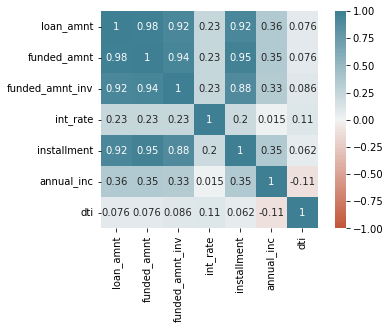

In [76]:
cont_vars = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv',
            'int_rate', 'installment',  'annual_inc', 
            'dti'
            ]

df_cont_bivar = pd.DataFrame(df_final_data,columns=cont_vars)
corrMatrix = df_cont_bivar.corr()
sns.heatmap(corrMatrix, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True
    )
plt.show()

### 4.2 Categorical variables

In [77]:
cat_vars = [
    'term',  'grade', 'sub_grade', 'emp_length', 'home_ownership',
    'verification_status', 'purpose', 'zip_code', 'addr_state',
    'pub_rec_bankruptcies', 'issue_month', 'issue_year',
    'installment_cat', 'annual_inc_cat', 'int_rate_cat', 'funded_amnt_inv_cat', 'dti_cat'
]
target_var = 'loan_status'

#### 4.2.0 Analysis Functions

##### Combined Barplot

In [78]:
def bivar_cat_analysis(data_df,col_name_1,col_name_2):
    rel_data_df = data_df.copy()
    rel_data_df.dropna(subset=[col_name_1,col_name_2],inplace=True)
    df_grp = pd.pivot_table(data=rel_data_df,index=[col_name_1,col_name_2], columns=['loan_status'], aggfunc={'loan_status':'count'})
    df_grp.dropna(inplace=True)
    df_grp= pd.DataFrame(df_grp.to_records())
    # print(df_grp)
    df_grp['Charged Off'] = df_grp["('loan_status', 'Charged Off')"]
    df_grp.drop("('loan_status', 'Charged Off')",axis=1,inplace=True)
    df_grp['Fully Paid'] = df_grp["('loan_status', 'Fully Paid')"]
    df_grp.drop("('loan_status', 'Fully Paid')",axis=1,inplace=True)
    total = df_grp.sum()
    total_rec = round(100.0 * total['Fully Paid'] / (total['Fully Paid'] + total['Charged Off']),2)
    # print(total_rec)
    df_grp['Percent Recovery'] = (100.0 * df_grp['Fully Paid'] / (df_grp['Fully Paid'] + df_grp['Charged Off'])).round(2)
    df_grp['Overall Recovery'] = [total_rec] * len(df_grp)
    # print(df_grp)
    data_len = len(df_grp)
    df_grp['Categories'] = ['[{} & {}]'.format(df_grp[col_name_1].iloc[x],df_grp[col_name_2].iloc[x]) for x in range(data_len)]
    if col_name_1 in dict_order_cat_vars:
        df_grp['sort'] = [dict_order_cat_vars[col_name_1][x] for x in df_grp[col_name_1]]
        # print(df_grp)
        df_grp = df_grp.sort_values(by='sort')
    else:
        df_grp = df_grp.sort_values(by=col_name_1)
    # fig = go.Figure()
    uniq_cats_col_1 = df_grp[col_name_1].unique()
    uniq_cats_col_2 = df_grp[col_name_2].unique()
    # subplot_titles = tuple(uniq_cats_col_1)
    # print(subplot_titles)
    # 
    fig = make_subplots(
        rows=1, cols=len(uniq_cats_col_1),
        subplot_titles=tuple(uniq_cats_col_1),
        shared_yaxes=True,
        # shared_yaxes2=True,
        x_title=dict_col_disp[col_name_2],
        # y_title='Frequency',
        # horizontal_spacing=0.08,
        specs=[
            [{"secondary_y": True}]*len(uniq_cats_col_1)
            ]
        )
    for col_cntr in range(len(uniq_cats_col_1)):
        if col_cntr == 0:
            show_legend = True
        else:
            show_legend = False
        
        df_rel_data = df_grp[df_grp[col_name_1] == uniq_cats_col_1[col_cntr]]
        if col_name_2 in dict_order_cat_vars:
            df_rel_data['sort'] = [dict_order_cat_vars[col_name_2][x] for x in df_rel_data[col_name_2]]
            # print(df_grp)
            df_rel_data = df_rel_data.sort_values(by='sort')
        else:
            df_rel_data = df_rel_data.sort_values(by=col_name_2)
        fig.add_trace(
            go.Bar(
                name="Charged Off",
                x=df_rel_data[col_name_2],
                y=df_rel_data['Charged Off'],
                yaxis='y1',
                legendgroup='group1',
                showlegend=show_legend,
                marker_color='red'
                ),
                row=1, 
                col=col_cntr+1,
                secondary_y=False
            )
        fig.add_trace(
            go.Bar(
                name="Fully Paid",
                x=df_rel_data[col_name_2],
                y=df_rel_data['Fully Paid'],
                yaxis='y1',
                legendgroup='group1',
                showlegend=show_legend,
                marker_color='green'
                ),
                row=1, 
                col=col_cntr+1,
                secondary_y=False
            )
        fig.add_trace(go.Scatter(
                mode='lines+markers',
                line={'dash': 'dash', 'color': 'purple'},
                name='% Recovery',
                x=df_rel_data[col_name_2],
                y=df_rel_data['Percent Recovery'],
                yaxis='y2',
                legendgroup='group1',
                showlegend=show_legend
                ),
                row=1, 
                col=col_cntr+1,
                secondary_y=True
            )
        fig.add_trace(go.Scatter(
                mode='lines',
                line={'dash': 'dash', 'color': 'black'},
                name='Overall % Recovery',
                x=df_rel_data[col_name_2],
                y=df_rel_data['Overall Recovery'],
                yaxis='y2',
                legendgroup='group1',
                showlegend=show_legend
                ),
                row=1, 
                col=col_cntr+1,
                secondary_y=True
            )
    # # plot_data = [tr0,tr1,tr2]
    # f = fig.full_figure_for_development(warn=False)
    fig.layout.update(
        barmode='group',
        # title='Loan Status Bivariate Analysis ({}, {})'.format(dict_col_disp[col_name_1],dict_col_disp[col_name_2]),
        # yaxis=dict(title='Frequency'),
        # yaxis16=dict(title='Recovery %',overlaying='y',side='right'),
        # xaxis=dict(
        #     title='({},{})'.format(dict_col_disp[col_name_1],dict_col_disp[col_name_2]),
        #     # tickangle=60,
        #     dtick=1
        # ),
        margin=go.layout.Margin(
            l=20, #left margin
            r=20, #right margin
            b=20, #bottom margin
            t=20  #top margin
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )
    fig.update_xaxes(dtick=1,tickangle=60)
    fig.update_layout(title='Loan Status Bivariate Analysis ({}, {})  y1: Frequency, y2: % Recovery '.format(dict_col_disp[col_name_1],dict_col_disp[col_name_2]),)
    for col_cntr in range(len(uniq_cats_col_1)):
        arg_str = {"yaxis{}".format(2 * (col_cntr+1)): dict(range=[0,100])}
        fig.update_layout(**arg_str)
        # arg_str = {"yaxis{}".format(2 * (col_cntr+1)): dict(title='Recovery %',overlaying='y',side='right')}
        # fig.update_layout(**arg_str)
        # if col_cntr+1 == len(uniq_cats_col_1):
        #     arg_str = {"yaxis{}".format(2 * (col_cntr+1)): dict(title='Recovery %',overlaying='y',side='right')}
        #     fig.update_layout(**arg_str)
    fig.update_layout(title_y=0.0,title_x=0.5)
    # fig.update_yaxes(title_text='Recovery %', secondary_y=True)
    # fig.update_yaxes(title_text='Frequency', secondary_y=False)
    # fig.update_legend()
    return fig

# var_1 = 'grade'
# var_2 = 'term'
# fig = bivar_cat_analysis(df_final_data,var_1,var_2)
# fig.update_layout(width=1200,height=500) 

##### Percentage Contribution To Loan Status

In [79]:
def bivar_cat_analysis_contrib(data_df,col_name_1,col_name_2):
    rel_data_df = data_df.copy()
    rel_data_df.dropna(subset=[col_name_1,col_name_2],inplace=True)
    df_grp = pd.pivot_table(data=rel_data_df,index=[col_name_1,col_name_2], columns=['loan_status'], aggfunc={'loan_status':'count'})
    df_grp.dropna(inplace=True)
    df_grp= pd.DataFrame(df_grp.to_records())
    # print(df_grp)
    df_grp['Charged Off'] = df_grp["('loan_status', 'Charged Off')"]
    df_grp.drop("('loan_status', 'Charged Off')",axis=1,inplace=True)
    df_grp['Fully Paid'] = df_grp["('loan_status', 'Fully Paid')"]
    df_grp.drop("('loan_status', 'Fully Paid')",axis=1,inplace=True)

    # print(df_grp)
    df_grp['Charged Off (%)'] = (100 * df_grp['Charged Off'] / df_grp['Charged Off'].sum()).round(2)
    df_grp['Fully Paid (%)'] = (100 * df_grp['Fully Paid'] / df_grp['Fully Paid'].sum()).round(2)

    # print(df_grp)
    data_len = len(df_grp)
    df_grp['Categories'] = ['[{} & {}]'.format(df_grp[col_name_1].iloc[x],df_grp[col_name_2].iloc[x]) for x in range(data_len)]

    if col_name_1 in dict_order_cat_vars:
        df_grp['sort'] = [dict_order_cat_vars[col_name_1][x] for x in df_grp[col_name_1]]
        # print(df_grp)
        df_grp = df_grp.sort_values(by='sort')
    else:
        df_grp = df_grp.sort_values(by=col_name_1)
        
    max_charged_idx = int(df_grp['Charged Off (%)'].idxmax())
    min_charged_idx = int(df_grp['Charged Off (%)'].idxmin())

    max_paid_idx = int(df_grp['Fully Paid (%)'].idxmax())
    min_paid_idx = int(df_grp['Fully Paid (%)'].idxmin())
    # print(max_charged_idx)
    print("########## Max & Min Analysis ########")
    print("---------- Charged Off ---------------")
    print("Maximum contribution: {} ({}%)".format(
            df_grp.at[max_charged_idx,'Categories'],
            df_grp.at[max_charged_idx,'Charged Off (%)']
            )
        )
    print("Minimum contribution: {} ({}%)".format(
            df_grp.at[min_charged_idx, 'Categories'],
            df_grp.at[min_charged_idx,'Charged Off (%)']
            )
        )
    print("---------- Fully paid ---------------")
    print("Maximum contribution: {} ({}%)".format(
            df_grp.at[max_paid_idx, 'Categories'],
            df_grp.at[max_paid_idx, 'Fully Paid (%)']
            )
        )
    print("Minimum contribution: {} ({}%)".format(
            df_grp.at[min_paid_idx,'Categories'],
            df_grp.at[min_paid_idx, 'Fully Paid (%)']
            )
        )
    # print(df_grp)
    # fig = go.Figure()
    uniq_cats_col_1 = df_grp[col_name_1].unique()
    uniq_cats_col_2 = df_grp[col_name_2].unique()
    # subplot_titles = tuple(uniq_cats_col_1)
    # print(subplot_titles)
    fig = make_subplots(
        rows=1, cols=len(uniq_cats_col_1),
        subplot_titles=tuple(uniq_cats_col_1),
        shared_yaxes=True,
        x_title=dict_col_disp[col_name_2],
        y_title='% Contribution to Loan Status',
        )
    for col_cntr in range(len(uniq_cats_col_1)):
        if col_cntr == 0:
            show_legend = True
        else:
            show_legend = False
        
        df_rel_data = df_grp[df_grp[col_name_1] == uniq_cats_col_1[col_cntr]]
        if col_name_2 in dict_order_cat_vars:
            df_rel_data['sort'] = [dict_order_cat_vars[col_name_2][x] for x in df_rel_data[col_name_2]]
            # print(df_grp)
            df_rel_data = df_rel_data.sort_values(by='sort')
        else:
            df_rel_data = df_rel_data.sort_values(by=col_name_2)
        fig.add_trace(
            go.Bar(
                name="Charged Off (%)",
                x=df_rel_data[col_name_2],
                y=df_rel_data['Charged Off (%)'],
                yaxis='y1',
                legendgroup='group1',
                showlegend=show_legend,
                marker_color='red'
                ),
                row=1, col=col_cntr+1
            )
        fig.add_trace(
            go.Bar(
                name="Fully Paid (%)",
                x=df_rel_data[col_name_2],
                y=df_rel_data['Fully Paid (%)'],
                yaxis='y1',
                legendgroup='group1',
                showlegend=show_legend,
                marker_color='green'
                ),
                row=1, col=col_cntr+1
            )
    fig.layout.update(
        barmode='group',
        # yaxis=dict(title='% Contribution'),
        # xaxis=dict(
        #     # title='{}'.format(dict_col_disp[col_name_2]),
        #     # tickangle=90,
        #     dtick=1
        # ),
        margin=go.layout.Margin(
            l=60, #left margin
            r=20, #right margin
            b=80, #bottom margin
            t=30  #top margin
        ),
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        ),
    )
    fig.update_xaxes(dtick=1,tickangle=60)
    fig.update_layout(title='Loan Status Bivariate Analysis ({}, {})'.format(dict_col_disp[col_name_1],dict_col_disp[col_name_2]),)
    fig.update_layout(title_y=0.0,title_x=0.5)
    return fig

#### 4.2.1 Grade & Term

In [80]:
var_1 = 'grade'
var_2 = 'term'
fig = bivar_cat_analysis(df_final_data,var_1,var_2)
fig.update_layout(width=1200,height=500)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2))  
pio.write_image(fig, "images/bivar_{}_{}.png".format(var_1,var_2), format='png')

fig = bivar_cat_analysis_contrib(df_final_data,var_1,var_2)
fig.update_layout(width=1200,height=500)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2))  
pio.write_image(fig, "images/bivar_cat_{}_{}.png".format(var_1,var_2), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: [B &  36 months] (18.56%)
Minimum contribution: [G &  36 months] (0.29%)
---------- Fully paid ---------------
Maximum contribution: [A &  36 months] (28.55%)
Minimum contribution: [G &  36 months] (0.06%)


#### 4.2.2 Employment Length & Grade

In [81]:
var_1 = 'emp_length'
var_2 = 'grade'
fig = bivar_cat_analysis(df_final_data,var_1,var_2)
fig.update_layout(width=2000,height=600)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2)) 
pio.write_image(fig, "images/bivar_{}_{}.png".format(var_1,var_2), format='png')

fig = bivar_cat_analysis_contrib(df_final_data,var_1,var_2)
fig.update_layout(width=2000,height=600)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2))  
pio.write_image(fig, "images/bivar_cat_{}_{}.png".format(var_1,var_2), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: [10+ years & B] (6.11%)
Minimum contribution: [8 years & G] (0.02%)
---------- Fully paid ---------------
Maximum contribution: [10+ years & A] (6.98%)
Minimum contribution: [1 year & G] (0.01%)


#### 4.2.3 Purpose & Grade

In [82]:
var_1 = 'purpose'
var_2 = 'grade'
fig = bivar_cat_analysis(df_final_data,var_1,var_2)
fig.update_layout(width=2000,height=400)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2)) 
pio.write_image(fig, "images/bivar_{}_{}.png".format(var_1,var_2), format='png')

fig = bivar_cat_analysis_contrib(df_final_data,var_1,var_2)
fig.update_layout(width=2000,height=400)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2))  
pio.write_image(fig, "images/bivar_cat_{}_{}.png".format(var_1,var_2), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: [debt_consolidation & B] (11.94%)
Minimum contribution: [car & G] (0.02%)
---------- Fully paid ---------------
Maximum contribution: [debt_consolidation & B] (14.94%)
Minimum contribution: [car & G] (0.0%)


#### 4.2.3 Funding Status and Grade

In [83]:
var_1 = 'funding_status'
var_2 = 'grade'
fig = bivar_cat_analysis(df_final_data,var_1,var_2)
fig.update_layout(width=1200,height=400)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2)) 
pio.write_image(fig, "images/bivar_{}_{}.png".format(var_1,var_2), format='png')

fig = bivar_cat_analysis_contrib(df_final_data,var_1,var_2)
fig.update_layout(width=1200,height=400)
py.iplot(fig, filename='bivar_cat_{}_{}'.format(var_1,var_2))  
pio.write_image(fig, "images/bivar_cat_{}_{}.png".format(var_1,var_2), format='png')

########## Max & Min Analysis ########
---------- Charged Off ---------------
Maximum contribution: [lesser & B] (14.01%)
Minimum contribution: [equal & G] (0.61%)
---------- Fully paid ---------------
Maximum contribution: [lesser & B] (16.47%)
Minimum contribution: [equal & G] (0.16%)


END